<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Analyze-Call-logs" data-toc-modified-id="Analyze-Call-logs-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Analyze Call logs</a></span><ul class="toc-item"><li><span><a href="#Load-data---Extract-Transform-and-Load" data-toc-modified-id="Load-data---Extract-Transform-and-Load-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Load data - Extract Transform and Load</a></span></li><li><span><a href="#Data-profiling" data-toc-modified-id="Data-profiling-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Data profiling</a></span></li><li><span><a href="#Call-drops" data-toc-modified-id="Call-drops-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Call drops</a></span></li><li><span><a href="#Root-cause-analysis---why-we-have-call-drops-?" data-toc-modified-id="Root-cause-analysis---why-we-have-call-drops-?-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Root cause analysis - why we have call drops ?</a></span></li><li><span><a href="#Lets-analyze-No-of-agents-vs-No-of--active-calls-every-hour" data-toc-modified-id="Lets-analyze-No-of-agents-vs-No-of--active-calls-every-hour-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Lets analyze No of agents vs No of  active calls every hour</a></span></li><li><span><a href="#Are-customers-dropping-due-to-high-wait-times-in-queue-?" data-toc-modified-id="Are-customers-dropping-due-to-high-wait-times-in-queue-?-1.6"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>Are customers dropping due to high wait times in queue ?</a></span></li><li><span><a href="#Does-agents-spend-significant-time-servicing-each-customer-calls-at-peak-time-cause-increase-in-call-drops-?" data-toc-modified-id="Does-agents-spend-significant-time-servicing-each-customer-calls-at-peak-time-cause-increase-in-call-drops-?-1.7"><span class="toc-item-num">1.7&nbsp;&nbsp;</span>Does agents spend significant time servicing each customer calls at peak time cause increase in call drops ?</a></span></li></ul></li></ul></div>

## Analyze Call logs

In [1]:
# Import libraries

# Data reading and manipulation
import pandas as pd
from datetime import datetime, timedelta
import calendar
from os.path import join
import sys, os
from collections import defaultdict
import itertools
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import ttest_ind

# Defined modules
from py_modules.Data_validation import validate_df, clean_df , transform_df

# For any plots
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as patches
import seaborn as sns

%matplotlib inline
sns.set()

### Load data - Extract Transform and Load

In [2]:
data_path = "C:\\Myprojects\\Dev\\Datasets\\Call_logs"
files = ["january.txt",
         "february.txt",
         "march.txt",
         "april.txt",
         "may.txt",
         "june.txt",
         "july.txt",
         "august.txt",
         "september.txt",
         "october.txt",
         "november.txt",
         "december.txt"]

In [3]:
# Extract, clean, validate and load
df_calldata = pd.DataFrame()
df_errdata = pd.DataFrame()

for file in files:
    ## File reading
    print("Reading file : ",file)
    df = pd.read_csv(join(data_path,file),sep='\t',header=(0))
    
    ## Data cleaning
    df = clean_df(df)
    
    ## Data validation
    df1, df2, indx = validate_df(df)
    
    # Data transform
    df1 = transform_df(df1)
    
    ## Merge clean data
    df_calldata = df_calldata.append(df1,sort=False,ignore_index=True)
    
    ## Merge errored data
    w = defaultdict(dict)
    for key,val in indx.items():
        if len(val) > 0 :
            for v in val:
                w[v]['Err_'+key.split()[1]] = key.split()[0]        
    df_errdata = df_errdata.append(df2.join(pd.DataFrame.from_dict(w).T),sort=False,ignore_index=True)

Reading file :  january.txt


C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\pandas\core\indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\pandas\core\indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
c:\Myprojects\GitHUB\Call-centre-timeseries-data-analysis\py_modules\Data_validation.py:157: SettingWithCopyWarning: 
A value is trying

Reading file :  february.txt
Reading file :  march.txt
Reading file :  april.txt
Reading file :  may.txt
Reading file :  june.txt
Reading file :  july.txt


C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\IPython\core\interactiveshell.py:3319: DtypeWarning: Columns (3,5,8,11,15) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


Reading file :  august.txt
Reading file :  september.txt
Reading file :  october.txt
Reading file :  november.txt
Reading file :  december.txt


Note : Columns (3,5,8,11,15) have mixed types from July . More details could be found in error report.

In [4]:
## No of error per column
error_cols = [col for col in df_errdata.columns if col[0:4] == 'Err_']
for col in error_cols:
    print("Errors in column {} : {}".format(col[4:],sum(~df_errdata[col].isnull())))

Errors in column type : 17
Errors in column vru_time : 362
Errors in column q_time : 72
Errors in column ser_time : 313
Errors in column priority : 12
Errors in column date : 12
Errors in column vru_exit : 12
Errors in column q_exit : 12
Errors in column ser_exit : 12
Errors in column outcome : 12


In [5]:
## View of erred data
df_errdata[[col for col in df_errdata if col not in error_cols]]

,vru+line,call_id,customer_id,priority,type,date,vru_entry,vru_exit,vru_time,q_start,q_exit,q_time,outcome,ser_start,ser_exit,ser_time,server
0,AA0203,33801,58703380.0,1,PS,990113,15:22:19,15:20:05,-134,15:20:05,15:23:22,197,AGENT,15:23:22,15:29:16,354,MORIAH
1,AA0103,24076,59184945.0,1,PS,990102,23:56:07,23:56:12,5,23:56:12,23:58:01,109,AGENT,23:58:00,0:01:08,188,YITZ
2,AA0102,28822,0.0,0,PS,990106,23:59:34,23:59:47,13,0:00:00,0:00:00,0,AGENT,23:59:46,0:02:17,151,BENSION
3,AA0201,34520,0.0,0,PS,990121,23:59:42,23:59:54,12,0:00:00,0:00:00,0,AGENT,23:59:53,0:01:31,98,AVNI
4,AA0102,29352,56721426.0,2,PS,990118,15:13:15,15:12:59,-16,15:12:59,15:13:58,59,HANG,0:00:00,0:00:00,0,NO_SERVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722,AA0201,51344,0.0,0,PS,991227,23:59:35,23:59:46,11,0:00:00,0:00:00,0,AGENT,23:59:45,0:00:15,30,AVI
723,AA0209,51205,24147951.0,1,PS,991202,14:16:15,14:15:19,-56,14:15:19,14:18:05,166,HANG,0:00:00,0:00:00,0,NO_SERVER
724,AA0116,13327,0.0,0,IN,991216,23:59:13,23:59:13,0,23:59:22,0:00:24,62,HANG,0:00:00,0:00:00,0,NO_SERVER
725,AA0201,51482,0.0,0,PS,991229,23:58:20,23:58:31,11,0:00:00,0:00:00,0,AGENT,23:58:31,0:01:40,189,ZIPI


In [6]:
## View of errors for records above
df_errdata[error_cols]

,Err_type,Err_vru_time,Err_q_time,Err_ser_time,Err_priority,Err_date,Err_vru_exit,Err_q_exit,Err_ser_exit,Err_outcome
0,NaN,Invalid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,Invalid,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,Invalid,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,Invalid,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,Invalid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
722,NaN,NaN,NaN,Invalid,NaN,NaN,NaN,NaN,NaN,NaN
723,NaN,Invalid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
724,NaN,NaN,Invalid,NaN,NaN,NaN,NaN,NaN,NaN,NaN
725,NaN,NaN,NaN,Invalid,NaN,NaN,NaN,NaN,NaN,NaN


Above two error reports could help us devise cleaning rules , and it would be an iterative process to update the clean_df, run validation_df, load the file again and see the reports. 


In [7]:
# find error records by percent
print("Erred data by percent {:.2f} %".format(df_errdata.shape[0]*100/(df_errdata.shape[0]+df_calldata.shape[0])))

Erred data by percent 0.16 %



Among the pending errors - About 5 records have invalid type 'AA' and remaining has mapping issues with either format (tab delimited) that has possibly missed a tab character between priority and type, or time being -ve since exit time is earlier than start time. Since they are few we will ignore these records due to the low volume.


### Data profiling

In [8]:
# Valid date - size
df_calldata.shape

(443721, 24)

In [9]:
# Summary data
df_calldata.head(5)

,vru+line,call_id,customer_id,priority,type,date,vru_entry,vru_exit,vru_time,q_start,...,ser_exit,ser_time,server,call_hour_start,call_datehour_start,vru,line,Weekday,Weekno,Month
0,AA0101,33116,9664491.0,2,PS,1999-01-01,1999-01-01 00:00:31,1999-01-01 00:00:36,5,1999-01-01 00:00:36,...,1999-01-01 00:00:00,0,NO_SERVER,0,1999-01-01 00:00:00,AA01,1,Friday,00,1
1,AA0101,33117,0.0,0,PS,1999-01-01,1999-01-01 00:34:12,1999-01-01 00:34:23,11,1999-01-01 00:00:00,...,1999-01-01 00:00:00,0,NO_SERVER,0,1999-01-01 00:00:00,AA01,1,Friday,00,1
2,AA0101,33118,27997683.0,2,PS,1999-01-01,1999-01-01 06:55:20,1999-01-01 06:55:26,6,1999-01-01 06:55:26,...,1999-01-01 06:56:37,54,MICHAL,6,1999-01-01 06:00:00,AA01,1,Friday,00,1
3,AA0101,33119,0.0,0,PS,1999-01-01,1999-01-01 07:41:16,1999-01-01 07:41:26,10,1999-01-01 00:00:00,...,1999-01-01 07:44:53,208,BASCH,7,1999-01-01 07:00:00,AA01,1,Friday,00,1
4,AA0101,33120,0.0,0,PS,1999-01-01,1999-01-01 08:03:14,1999-01-01 08:03:24,10,1999-01-01 00:00:00,...,1999-01-01 08:05:10,107,MICHAL,8,1999-01-01 08:00:00,AA01,1,Friday,00,1


In [10]:
# Schema info
df_calldata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 443721 entries, 0 to 443720
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   vru+line             443721 non-null  object        
 1   call_id              443721 non-null  int64         
 2   customer_id          443721 non-null  float64       
 3   priority             443721 non-null  object        
 4   type                 443721 non-null  object        
 5   date                 443721 non-null  datetime64[ns]
 6   vru_entry            443721 non-null  datetime64[ns]
 7   vru_exit             443721 non-null  datetime64[ns]
 8   vru_time             443721 non-null  object        
 9   q_start              443721 non-null  datetime64[ns]
 10  q_exit               443721 non-null  datetime64[ns]
 11  q_time               443721 non-null  object        
 12  outcome              443721 non-null  object        
 13  ser_start     

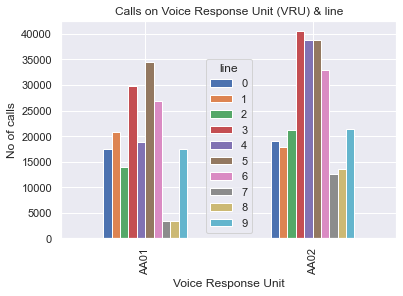

In [11]:
# Check Voice Response Unit (Vru) & line
ax=df_calldata.groupby(['vru','line'])['vru+line'].count().reset_index(name='count')\
                            .pivot(index='vru',columns='line',values='count').plot(kind='bar', \
                                                                                  title='Calls on Voice Response Unit (VRU) & line')

_=ax.set_xlabel("Voice Response Unit")
_=ax.set_ylabel("No of calls")

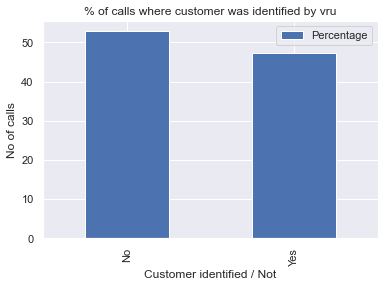

In [12]:
# % of calls where customer was identified by vru
identify_map = {False: "No", True: "Yes"}
ax=(df_calldata['customer_id'].map(lambda x : x > 0, na_action='ignore').value_counts()*100/df_calldata.shape[0])\
                    .reset_index().rename(columns={'index':'Customer_identified', 'customer_id':'Percentage'})\
                                                        .replace({"Customer_identified": identify_map})\
                                                        .set_index('Customer_identified')\
                                                        .plot(kind='bar', title="% of calls where customer was identified by vru")

_=ax.set_xlabel("Customer identified / Not")
_=ax.set_ylabel("No of calls")

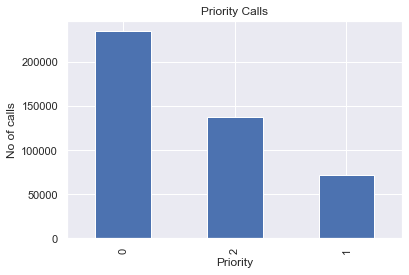

In [13]:
# Priority - calls
ax=df_calldata['priority'].value_counts().plot(kind='bar', title="Priority Calls")
_=ax.set_xlabel("Priority")
_=ax.set_ylabel("No of calls")

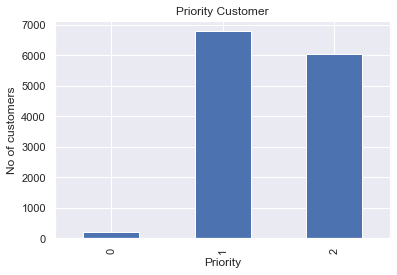

In [14]:
# Priority - customers
ax=df_calldata.groupby(['priority','customer_id'])['date'].count().reset_index().groupby(['priority'])['customer_id'].count()\
                                .plot(kind='bar', title="Priority Customer")
_=ax.set_xlabel("Priority")
_=ax.set_ylabel("No of customers")

In [15]:
# Call Types :
# • PS - regular activity (coded 'PS' for 'Peilut Shotefet') 
# • PE - regular activity in English (coded 'PE' for 'Peilut English') 
# • IN - internet consulting (coded 'IN' for 'Internet') 
# • NE -stock exchange activity (coded 'NE' for 'Niarot Erech') 
# • NW - potential customer getting information 
# • TT – customers who left a message asking the bank to return their call but, while the system returned their call, the #calling-agent became busy hence the customers were put on hold in the queue. 

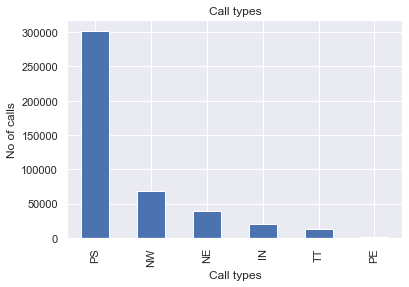

In [16]:
# type - calls
ax=df_calldata['type'].value_counts().plot(kind='bar', title="Call types")
_=ax.set_xlabel("Call types")
_=ax.set_ylabel("No of calls")

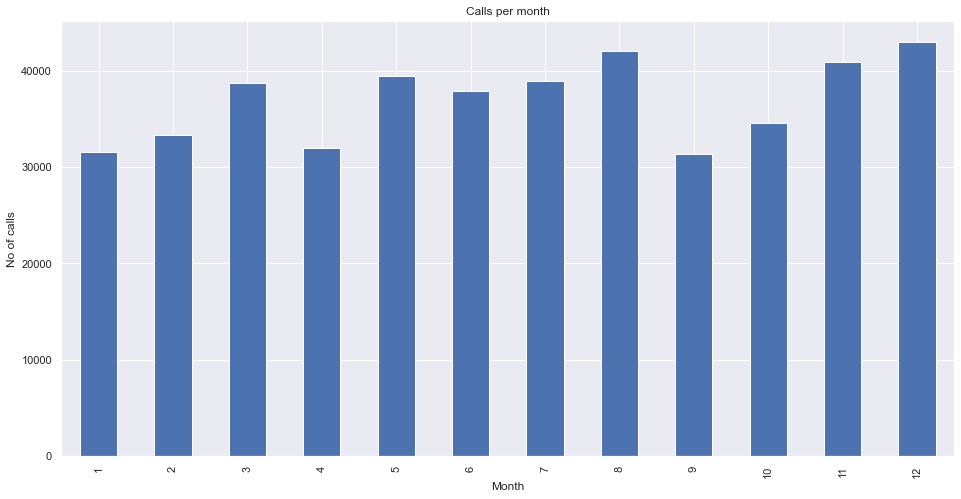

In [17]:
# No of calls per month
ax=df_calldata.apply(lambda x : x['date'].month,axis=1).value_counts().sort_index()\
                    .plot(kind='bar', title="Calls per month",figsize=(16,8))
_=ax.set_xlabel("Month")
_=ax.set_ylabel("No of calls")

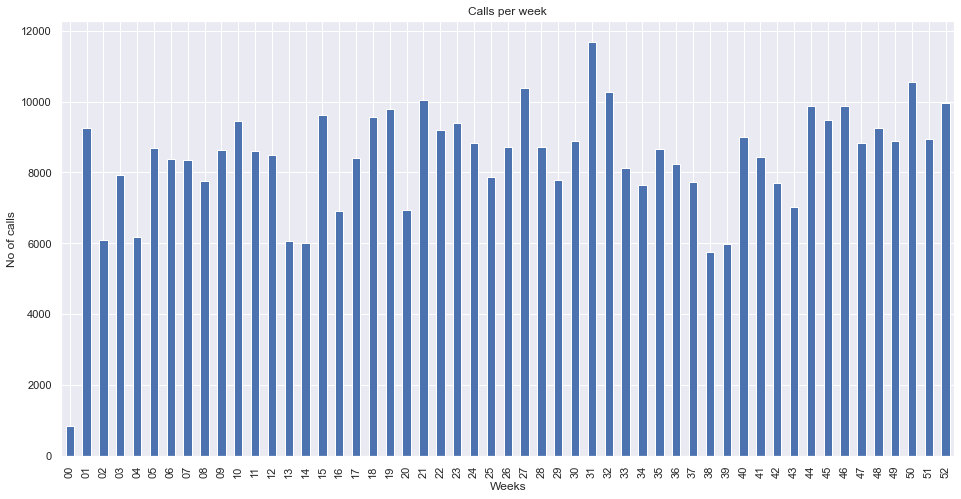

In [18]:
# No of calls per week
ax=df_calldata['Weekno'].value_counts().sort_index()\
                    .plot(kind='bar', title="Calls per week",figsize=(16,8))
_=ax.set_xlabel("Weeks")
_=ax.set_ylabel("No of calls")

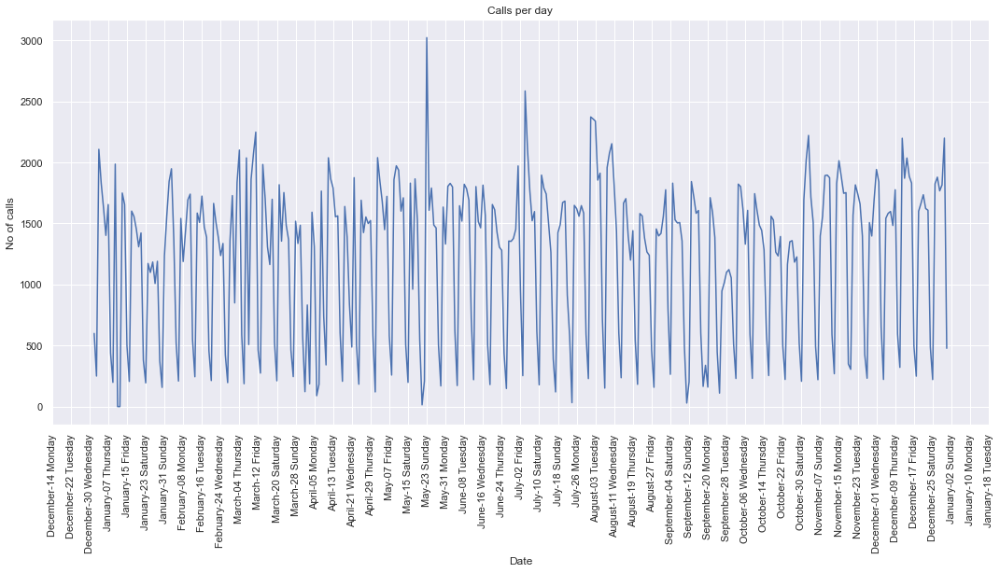

In [19]:
# No of calls per day
df=df_calldata.groupby(['date']).size().resample('1D').sum()
fig,ax=plt.subplots(figsize=(18,8))
plt.plot(df.index,df.values)
ax.set_xlabel("Date")
ax.set_ylabel("No of calls")
locator = mdates.DayLocator(interval=8) 
ax.xaxis.set_major_locator(locator)
fmt = mdates.DateFormatter('%B-%d %A') 
ax.xaxis.set_major_formatter(fmt)
plt.xticks(rotation = 90)
ax.set_title("Calls per day",)
plt.show()

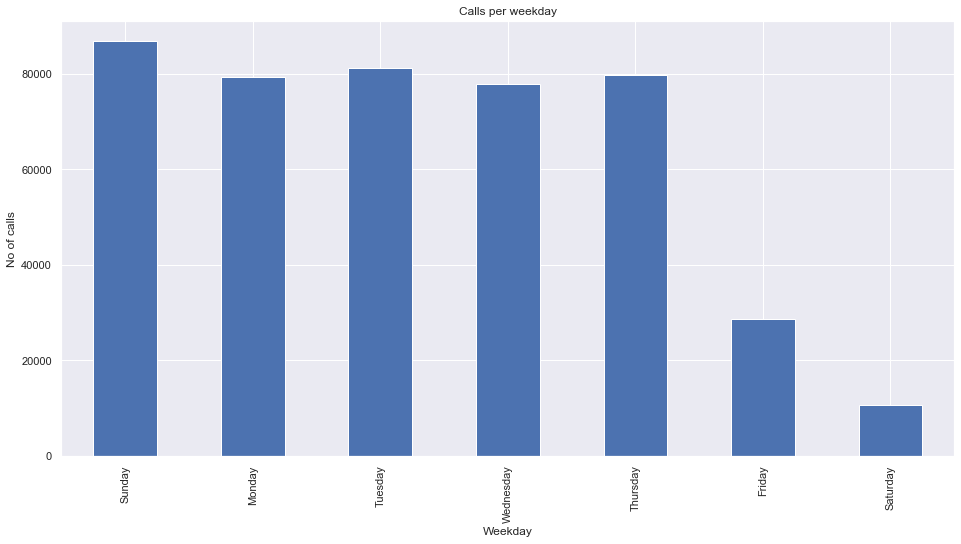

In [20]:
# No of calls per weekday
days_of_a_week = ['Sunday','Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday', 'Saturday']
ax=df_calldata['Weekday'].value_counts().loc[days_of_a_week]\
                    .plot(kind='bar', title="Calls per weekday",figsize=(16,8))
_=ax.set_xlabel("Weekday")
_=ax.set_ylabel("No of calls")

In [21]:
# There are 3 possible outcomes for each phone call: 
# - AGENT - service 
# - HANG - hung up 
# - PHANTOM - a virtual call to be ignored (unclear to us – fortunately, there are only few of these.)

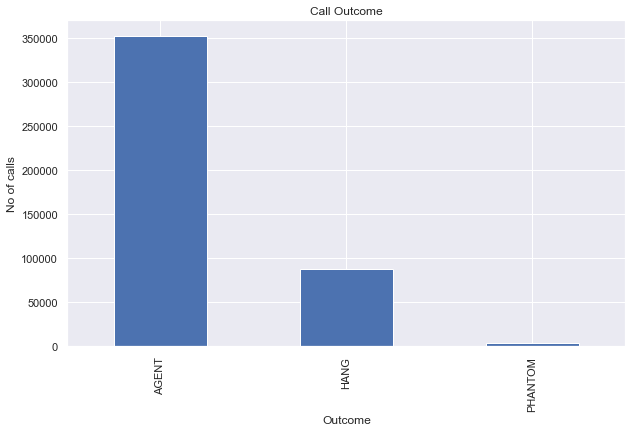

In [22]:
# outcome - calls
ax=df_calldata['outcome'].value_counts()\
                    .plot(kind='bar',figsize=(10,6), title="Call Outcome")
_=ax.set_xlabel("Outcome")
_=ax.set_ylabel("No of calls")

In [23]:
# How many unique customers identified by vru (Remove 0.0 customer)
print("No of unique customer identified by vru : {}".format(df_calldata['customer_id'].nunique() - 1))

# No of Agents
print("No of Agents : ",len(df_calldata['server'].unique()) - 1)

# Drop records for Phantom
df_calldata2 = df_calldata[df_calldata['outcome']!='PHANTOM'].copy()

# data set for summary
print("Summary info :")
df_calldata2['Customer_identified'] = df_calldata2.apply(lambda x : (int(x['customer_id']) > 0),axis=1)
df_calldata2['Agent_connected'] = df_calldata2.apply(lambda x : (x['server'] != 'NO_SERVER'),axis=1)
df_calldata2['Customer_serviced'] = df_calldata2.apply(lambda x : (x['outcome'] == 'AGENT'),axis=1)
df_calldata2['Customer_spoken_to'] = df_calldata2.apply(lambda x : (int(x['ser_time']) > 0),axis=1)
df_calldata2['Customer_wait_no_agent'] = df_calldata2.apply(lambda x : ((int(x['q_time']) > 0) \
                                                                              & (x['server'] == 'NO_SERVER')),axis=1)
df_calldata2.groupby(['Agent_connected','Customer_spoken_to','Customer_serviced'])\
                            .size().rename('Count').reset_index()

No of unique customer identified by vru : 12888
No of Agents :  52
Summary info :


,Agent_connected,Customer_spoken_to,Customer_serviced,Count
0,False,False,False,86454
1,False,False,True,41
2,False,True,False,1097
3,False,True,True,5174
4,True,False,True,1205
5,True,True,False,10
6,True,True,True,346161


In [24]:
# Customers waited but couldnt connect to an AGENT
print("Call drops : {:.2f} %"\
      .format(df_calldata2['Customer_wait_no_agent'].mean()*100))
df_calldata2.groupby(['Customer_wait_no_agent']).size().reset_index()

Call drops : 14.44 %


,Customer_wait_no_agent,0
0,False,376604
1,True,63538


### Call drops 


In [25]:
# plot graph objects using plotly
# Expected *kwargs e.g  {line_color : 'lightgrey', opacity = 1.0}
def plot_ts(time_ser_dict, title = 'Title', opacity = 1):
    #fig = go.Figure()
    fig = make_subplots(specs=[[{'secondary_y':True}]])
    for key in time_ser_dict:
        time_ser = time_ser_dict[key]['ts']
        kwargs = time_ser_dict[key]['kwargs']
        try : 
            sec_y = time_ser_dict[key]['secondary']['_y']
            yaxis_title = time_ser_dict[key]['secondary']['yaxis_title']
        except : 
            sec_y = False
            yaxis_title = None
        if isinstance(time_ser,list):
            fig.add_trace(go.Scatter(x = pd.concat([pd.Series(df_max.index),pd.Series(df_min.index)],axis=1), 
                                     y = pd.concat([pd.Series(df_max.values),pd.Series(df_min.values)],axis=1), 
                         **kwargs),secondary_y=sec_y)
        else :
            fig.add_trace(go.Scatter(x = time_ser.index, y = time_ser.values,
                         **kwargs),secondary_y=sec_y) 
        fig.update_yaxes(title_text=yaxis_title,secondary_y=sec_y)
    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    
    fig.show()

In [26]:
# Define plot function

def plot_calls(dfs,fig,ax,date_format='%B-%d %A',locator=None,title=None,\
                    x_label='Time of the call', y_label='Counts',**draw_style) :
    
    for i, df in enumerate(dfs) :
        ax.plot(df.index, df.values,label=df.name,**draw_style)
        
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    if title == None :
        title = 'Call Vs time'
    ax.set_title(title)
    if locator == None :
        locator = mdates.DayLocator(interval=1)
    else :
        locator = locator
    ax.xaxis.set_major_locator(locator)
    fmt = mdates.DateFormatter(date_format) 
    ax.xaxis.set_major_formatter(fmt)
    ax.legend(loc='upper right')
    fig.autofmt_xdate(rotation = 90)
    #plt.show()
    return fig, ax


In [27]:
# date - week map
date_range = pd.date_range(start=df_calldata2['call_datehour_start'].min(), end=df_calldata2['call_datehour_start'].max(),freq='H')
week_no = [datetime.strftime("%U") for datetime in date_range]
mnth_no = [datetime.month for datetime in date_range]
week_day = [calendar.day_name[datetime.weekday()] for datetime in date_range]
df_date_map = pd.DataFrame(zip(week_no,mnth_no,week_day),index=date_range, columns=['Weekno','Month','Weekday'])
df_date_map

,Weekno,Month,Weekday
1999-01-01 00:00:00,00,1,Friday
1999-01-01 01:00:00,00,1,Friday
1999-01-01 02:00:00,00,1,Friday
1999-01-01 03:00:00,00,1,Friday
1999-01-01 04:00:00,00,1,Friday
...,...,...,...
1999-12-31 18:00:00,52,12,Friday
1999-12-31 19:00:00,52,12,Friday
1999-12-31 20:00:00,52,12,Friday
1999-12-31 21:00:00,52,12,Friday


In [28]:
# Call drops
rec_index = df_calldata2[(df_calldata2['Customer_wait_no_agent'])].index
df_call_drops = df_calldata2.loc[rec_index].groupby(['call_datehour_start']).size()\
                .rename('Call drops').resample('1H').sum().fillna(0)

In [29]:
# Week no for analysis
Week = '47'

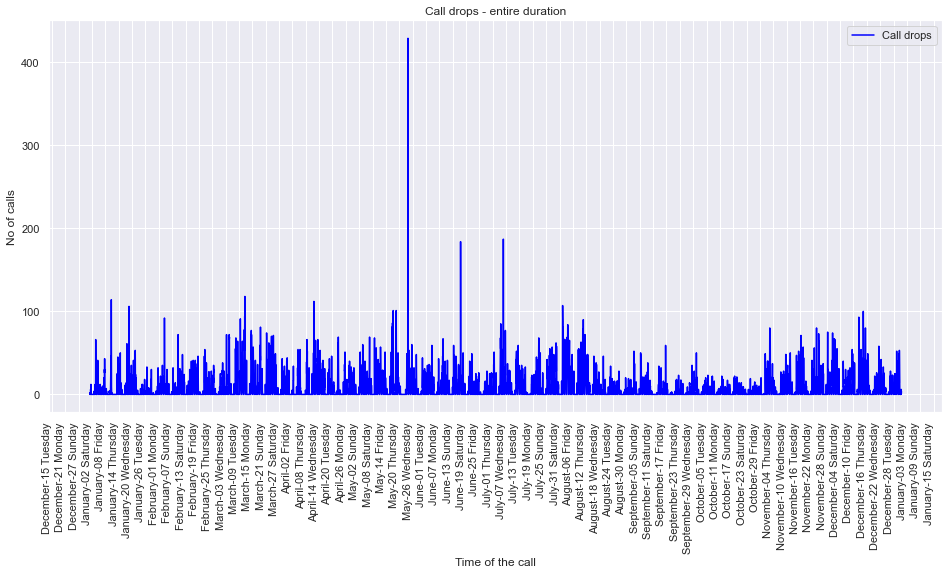

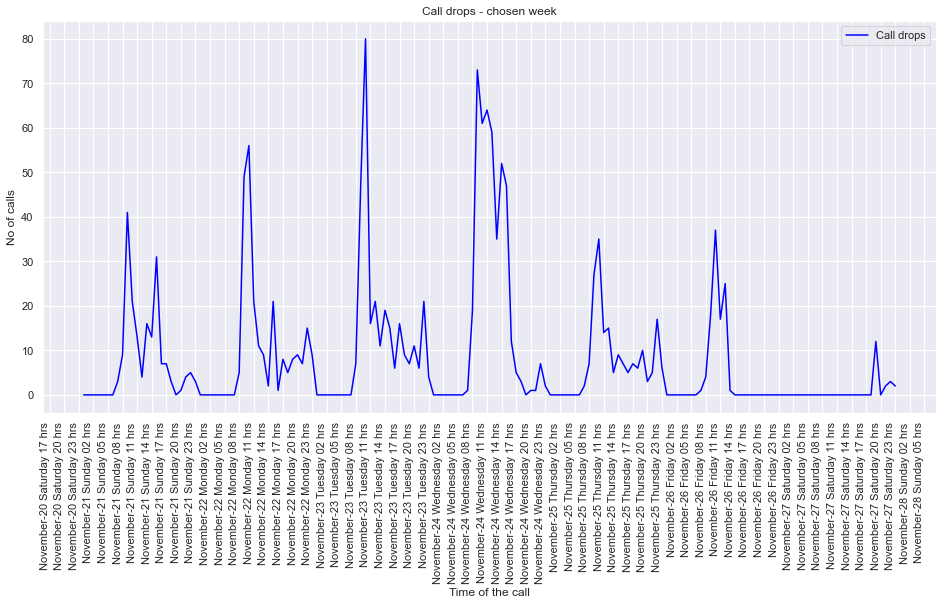

In [30]:
# All calls
fig, ax = plt.subplots(figsize=(16,8))
df = df_call_drops
fig, ax = plot_calls([df],locator=mdates.DayLocator(interval=6),y_label="No of calls",\
                            title='Call drops - entire duration',\
                            fig=fig,ax=ax,color='blue')
# Plot for chosen week
fig, ax = plt.subplots(figsize=(16,8))
df = df_call_drops[df_date_map[df_date_map.values==Week].index]
fig, ax = plot_calls([df],date_format='%B-%d %A %H hrs',locator=mdates.HourLocator(interval=3),y_label="No of calls",\
                            title='Call drops - chosen week',\
                            fig=fig,ax=ax,color='blue')

In [31]:
# plot calls received
time_ser_dict = {0:{'ts':df_call_drops, 'kwargs': 
                    {'line_color' : 'blue', 'opacity' : 1.0, 'name' : 'Calls dropped'}}}
plot_ts(time_ser_dict, title = 'Call drops')


### Root cause analysis - why we have call drops ?

In [32]:
#Calls received
df_call_recvd = df_calldata2.groupby(['call_datehour_start']).size()\
                .rename('Call recvd').resample('1H').sum().fillna(0)

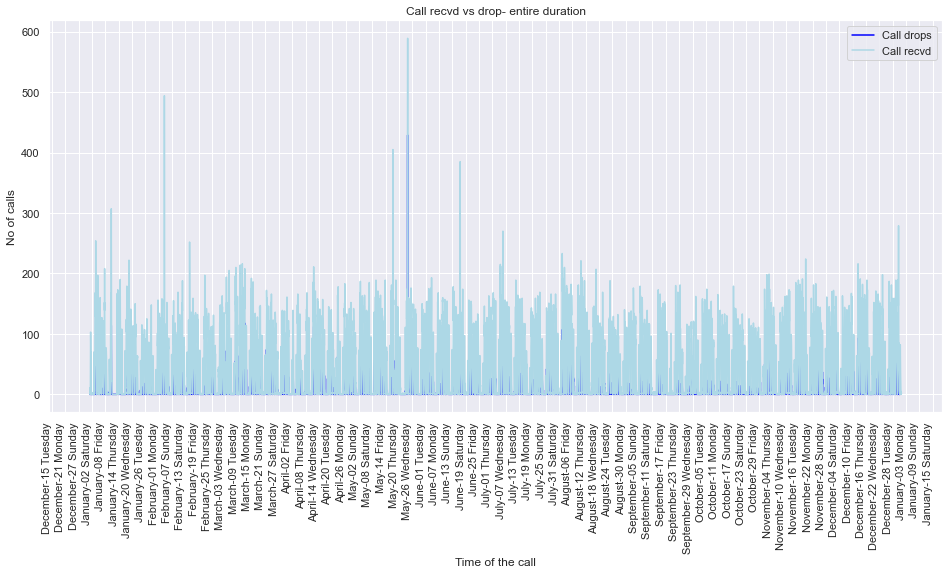

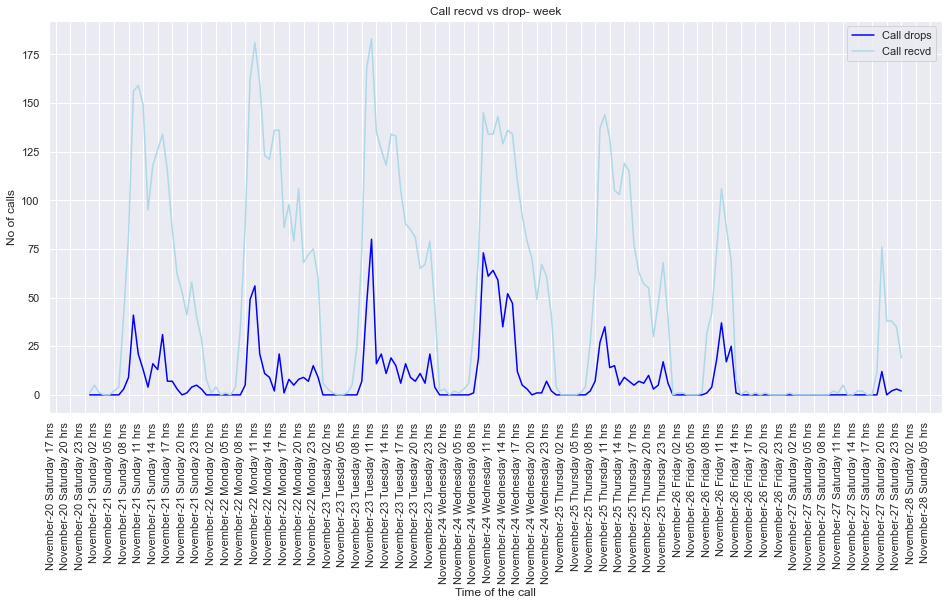

In [33]:
## All calls **********************************************************
fig, ax = plt.subplots(figsize=(16,8))

# Call drops
df1 = df_call_drops
fig, ax = plot_calls([df1],locator=mdates.DayLocator(interval=6),y_label="No of calls",\
                            title='Call drops - entire duration',\
                            fig=fig,ax=ax,color='blue')
# Calls received
df2 = df_call_recvd
fig, ax = plot_calls([df2],locator=mdates.DayLocator(interval=6),y_label="No of calls",\
                            title='Call recvd vs drop- entire duration',\
                            fig=fig,ax=ax,color='lightblue')
plt.show()


## Plot for chosen week **********************************************************
fig, ax = plt.subplots(figsize=(16,8))

# Call drops
df = df_call_drops[df_date_map[df_date_map.values==Week].index]
fig, ax = plot_calls([df],date_format='%B-%d %A %H hrs',locator=mdates.HourLocator(interval=3),y_label="No of calls",\
                            title='Call drops - chosen week',\
                            fig=fig,ax=ax,color='blue')

# Call received
df2 = df_call_recvd[df_date_map[df_date_map.values==Week].index]
fig, ax = plot_calls([df2],date_format='%B-%d %A %H hrs',locator=mdates.HourLocator(interval=3),y_label="No of calls",\
                            title='Call recvd vs drop- week',\
                            fig=fig,ax=ax,color='lightblue')
plt.show()

In [34]:
# plot calls received vs call drops
time_ser_dict = {0:{'ts':df_call_drops, 'kwargs': 
                    {'line_color' : 'blue', 'opacity' : 1.0, 'name' : 'Calls dropped'}},
                1:{'ts':df_call_recvd, 'kwargs': 
                    {'line_color' : 'lightblue', 'opacity' : 1.0, 'name' : 'Calls received'}}}
plot_ts(time_ser_dict, title = 'Calls received vs Call drops')


The call drop spike seems to have been correlated with spike in calls received. Lets check this using correlation coefficient

In [35]:
#calculate cross correlation
# correlation co-efficient
print("Correlation coefficient between calls received and call drops : {:.2f} "\
      .format(np.corrcoef(df_call_drops,df_call_recvd[df_call_drops.index])[0,1]))

Correlation coefficient between calls received and call drops : 0.76 


Above correlation value suggest there is strong correlation between call drops and calls received, however there could be other potential factors causing call drops

### Lets analyze No of agents vs No of  active calls every hour

- **No of agents**: An agent would be marked as available in an hour if he has serviced atleast 1 call. No of agents at an hour is the number of agents that are marked as available in that hour
- **No of active calls** : At an equal interval in an hour (default = 5 mins), calculate no of calls which are active (Either in VRU (Voice Response Unit), queue or being serviced by an agent). The min, mean and max of these 12 values (if interval = 5 mins per hour) every hour is used as no of active calls.

In [36]:
# Create mean, min, max and std of timeseries data that measures no of active call every 5 mins (defualt value)
def crt_active_call_df(df, t = 3600/12) :
    df['end_time'] = df.apply(lambda x : x[['vru_exit','q_exit','ser_exit']].max(),axis=1)
    df_calllist = df.apply(lambda x : [x['vru_entry'].ceil(str(t)+'S')+timedelta(seconds=t*i) for i in \
                        range(int((x['end_time'].floor(str(t)+'S') - x['vru_entry'].ceil(str(t)+'S')).total_seconds()/t)+1)],\
                            axis=1)
    df_customer_calls = pd.DataFrame(list(itertools.chain.from_iterable(df_calllist.to_list())),\
                                 columns=['Call_time2']).groupby(['Call_time2']).size()\
                                    .rename('Active_calls').reset_index()
    df_customer_calls['Call_time'] = df_customer_calls['Call_time2'].apply(lambda x: x.floor('3600S'))
    df_mean=df_customer_calls.set_index('Call_time')['Active_calls'].resample('1H').mean().fillna(0).rename('Active_calls_mean')
    df_max=df_customer_calls.set_index('Call_time')['Active_calls'].resample('1H').max().fillna(0).rename('Active_calls_max')
    df_min=df_customer_calls.set_index('Call_time')['Active_calls'].resample('1H').min().fillna(0).rename('Active_calls_min')
    df_std=df_customer_calls.set_index('Call_time')['Active_calls'].resample('1H').std().fillna(0).rename('Active_calls_std')
    
    return (df_mean, df_max,df_min,df_std)


In [37]:
# For those calls that are serviced - create a unique list of agents every hour
df_ser_calls = df_calldata2[~(df_calldata2['Customer_wait_no_agent'])][['server','call_datehour_start','ser_exit']]
df_ser_calls['call_datehour_end'] = df_ser_calls.apply(lambda x : x['ser_exit'].floor('3600S'),axis=1)
df_ser_calls2 = df_ser_calls.set_index('server').apply(lambda x : pd.date_range(x['call_datehour_start'],\
                                                      x['call_datehour_end'],freq='H'),axis=1)\
                                                    .explode().dropna().rename('call_hours').reset_index()
df_agents = df_ser_calls2.groupby(['call_hours'])['server'].apply(lambda x : len(set(x)))\
                    .resample('1H').sum().fillna(0).rename('No of agents')


In [38]:
# Mean, min, max and std of timeseries data that measures no of active call every 5 mins (defualt value)
time_val = 3600 /12   ## 300 seconds or 5 mins
df_mean, df_max, df_min, df_std = crt_active_call_df(df_calldata2, t=time_val)

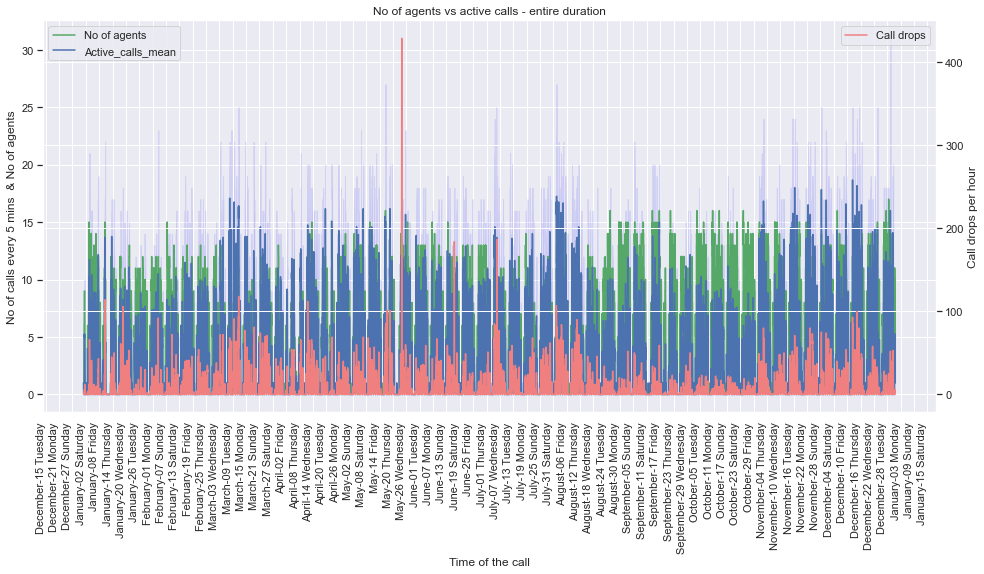

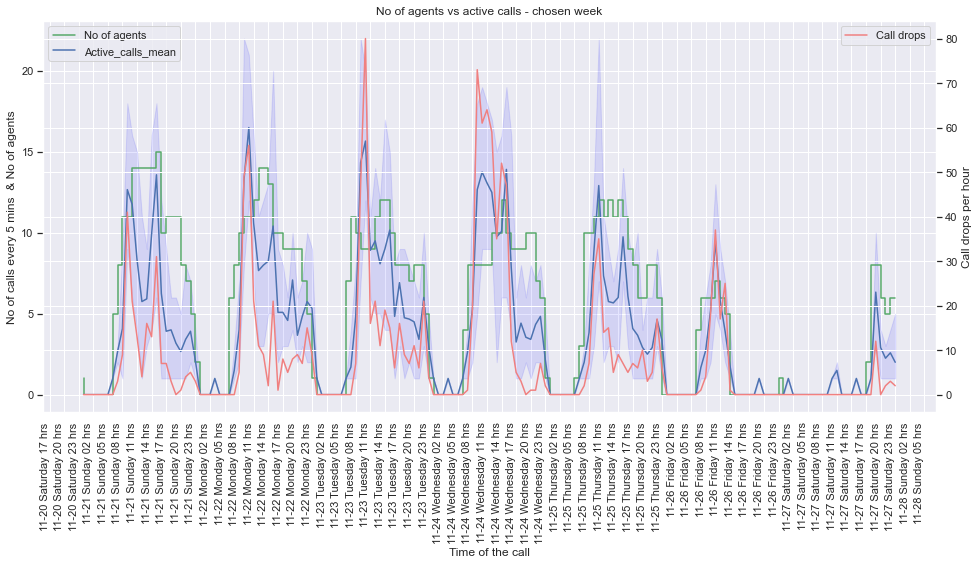

In [39]:
# No of Agents active each hour vs Active number of calls (measured at every 5 min interval each hour, 
# and use min, mean and max) **********************************************************

fig, ax = plt.subplots(figsize=(16,8))

# Agents
df1 = df_agents
fig, ax = plot_calls([df1],locator=mdates.DayLocator(interval=6),y_label="No of calls every 5 mins  & No of agents",\
                            title='No of agents - entire duration'\
                            ,fig=fig,ax=ax,drawstyle='steps',color='g')

# Mean of Active calls - and fill the area between min and max
fig, ax = plot_calls([df_mean],locator=mdates.DayLocator(interval=6),y_label="No of calls every 5 mins  & No of agents",\
                            title='No of agents vs active calls - entire duration'\
                            ,fig=fig,ax=ax)
ax.fill_between(df_min.index,df_min,df_max,facecolor='blue',color='blue',alpha=0.1)
ax.legend(loc='upper left')

# Call drops
ax_mirror = ax.twinx()
df2 = df_call_drops
fig, ax_mirror = plot_calls([df2],locator=mdates.DayLocator(interval=6),y_label="Call drops per hour",\
                            title='',fig=fig,ax=ax_mirror,color='lightcoral')
plt.show()


## Plot for chosen week **********************************************************
fig, ax = plt.subplots(figsize=(16,8))

# Agents
df1 = df_agents[df_date_map[df_date_map.values==Week].index]
fig, ax = plot_calls([df1],fig=fig,ax=ax,date_format='%B-%d %A %H hrs',locator=mdates.HourLocator(interval=3),\
                              y_label="No of calls every 5 mins  & No of agents",\
                            title='No of agents - for a week',drawstyle='steps',color='g')

# Mean of Active calls - and fill the area between min and max
df_mean1 = df_mean[df_date_map[df_date_map.values==Week].index]
df_max1 = df_max[df_date_map[df_date_map.values==Week].index]
df_min1 = df_min[df_date_map[df_date_map.values==Week].index]
df_std1 = df_std[df_date_map[df_date_map.values==Week].index]

fig, ax = plot_calls([df_mean1],date_format='%m-%d %A %H hrs',locator=mdates.HourLocator(interval=3),\
                            y_label="No of calls every 5 mins  & No of agents",\
                            title='No of agents vs active calls - chosen week',fig=fig,ax=ax,color='b')
plt.fill_between(df_min1.index,df_min1,df_max1,facecolor='blue',color='blue',alpha=0.1)
ax.legend(loc='upper left')

# Call drops
ax_mirror = ax.twinx()
df2 = df_call_drops[df_date_map[df_date_map.values==Week].index]
fig, ax_mirror = plot_calls([df2],date_format='%m-%d %A %H hrs',locator=mdates.HourLocator(interval=3),\
                                   y_label="Call drops per hour",\
                            title='',fig=fig,ax=ax_mirror,color='lightcoral')
plt.show()

In [40]:
# plot calls received vs call drops
time_ser_dict = {0:{'ts':df_agents, 'kwargs': 
                    {'line_color' : 'green', 'opacity' : 1.0, 'name' : 'Agents'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Agents, Active calls'}},
                1:{'ts':df_mean, 'kwargs': 
                    {'line_color' : 'rgba(0,0,255,1)', 'opacity' : 1.0, 'name' : 'Mean Active calls'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Agents, Active calls'}},
                2:{'ts':df_min, 'kwargs': 
                    {'line_color' : None,'name' : 'Min calls','showlegend':False,\
                     'mode':'lines','line_color':'rgba(0,0,255,0.2)'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Agents, Active calls'}},
                3:{'ts':df_max, 'kwargs': 
                    {'fill':'tonexty','fillcolor':'rgba(0,0,255,0.2)', \
                     'name' : 'Max calls','showlegend':False,'mode':'lines','line_color':'rgba(0,0,255,0.2)'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Agents, Active calls'}},
                4:{'ts':df_call_drops, 'kwargs': 
                    {'line_color' : 'red', 'opacity' : 1.0, 'name' : 'Calls dropped'},
                   'secondary':
                   {'_y':True,'yaxis_title':'Call drops'}}
                }
plot_ts(time_ser_dict,title='No of agents vs active calls and call drops')


The plot shows that there are spikes at certain time of the day, when the bank does not have enough agents to pick the calls being received and customer enters long waiting period. Though it appears that the agents do generally meet the average (mean) number of active calls (customers in the queue that are either being serviced and waiting to be serviced), but struggles to meet the peak (maximum) number of active calls (spikes). Can we prove this statistically ?

In [41]:
# Create Dataframe containing, No of agents, (mean,min,max,std) of active calls measued every 5 mins and their difference.
df_comp = pd.DataFrame(zip(df_agents[df_mean.index],df_mean,df_min,df_max,df_std),\
                       columns=[df_agents.name,df_mean.name,df_min.name,df_max.name,df_std.name],\
                       index=df_mean.index)
df_comp['Agent-minus-mean'] = df_comp.apply(lambda x : x['No of agents']-x['Active_calls_mean'], axis=1 )
df_comp['Agent-minus-min'] = df_comp.apply(lambda x : x['No of agents']-x['Active_calls_min'], axis=1 )
df_comp['Agent-minus-max'] = df_comp.apply(lambda x : x['No of agents']-x['Active_calls_max'], axis=1 )
df_comp['Agent-minus-std'] = df_comp.apply(lambda x : x['No of agents']-x['Active_calls_mean']-x['Active_calls_std'], axis=1 )

The no of "maximum active calls" (either being serviced or in queue measured every 5 mins) in an hour exceeding the number of agents, are marked as calls that could be potentially dropped.

In [42]:
# Estimated call drops
df_comp['Potential_call_drops'] = df_comp['Agent-minus-max'].apply(lambda x : -x if x < 0 else 0)

In [43]:
#calculate cross correlation
# correlation co-efficient
print("Correlation coefficient between call drops and Potential calls to drop : {:.2f} "\
        .format(np.corrcoef(df_call_drops,df_comp.loc[df_call_drops.index,'Potential_call_drops'])[0,1]))


Correlation coefficient between call drops and Potential calls to drop : 0.79 


### Are customers dropping due to high wait times in queue ?

Wait times on the queue of Customer serviced vs Not serviced : Timeseries plot for entire year and for a week

In [44]:
# Wait time of customer that are dropped
rec_index = df_calldata2[(df_calldata2['Customer_wait_no_agent'])].index
df_waittime_cus_drop = df_calldata2.loc[rec_index].set_index('call_datehour_start')['q_time'].apply(lambda x: float(x)/60)\
                        .resample('1H').mean().fillna(0).rename('Wait time customer dropped')

# Wait time of customer that are NOT dropped
rec_index = df_calldata2[~(df_calldata2['Customer_wait_no_agent'])].index
df_waittime_cus_nodrop = df_calldata2.loc[rec_index].set_index('call_datehour_start')['q_time'].apply(lambda x: float(x)/60)\
                        .resample('1H').mean().fillna(0).rename('Wait time customer not dropped')

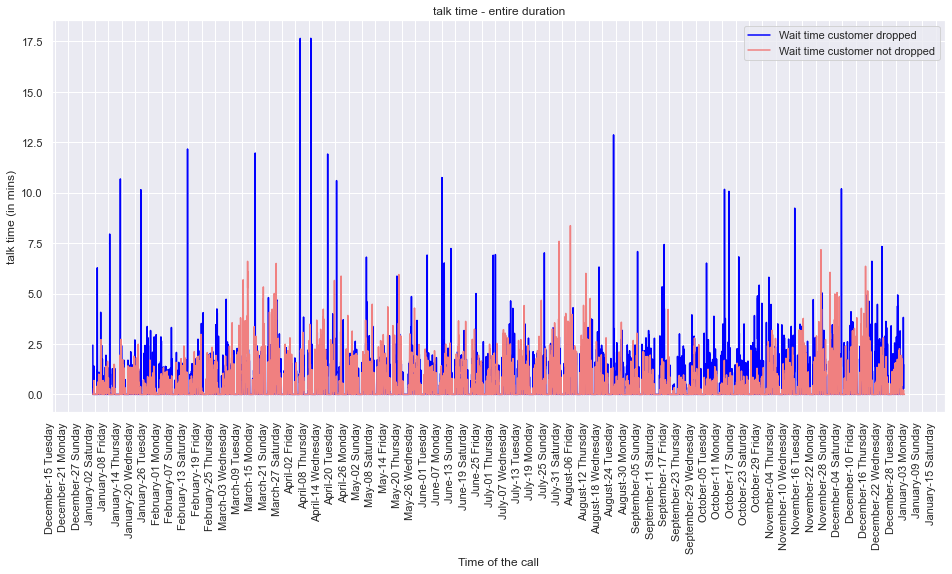

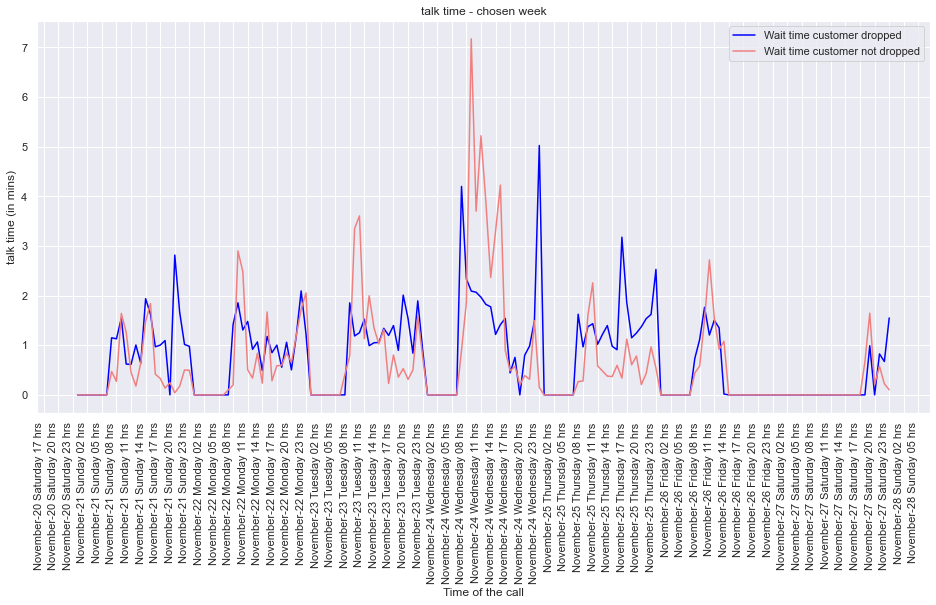

In [45]:
# Min/Avg/Max wait time before customer disconnects (all) ****************************************************
fig, ax = plt.subplots(figsize=(16,8))

# plot wait time of customer dropped from the call (without service)
df = df_waittime_cus_drop
fig, ax = plot_calls([df],locator=mdates.DayLocator(interval=6),y_label="talk time (in mins)",title='talk time - entire duration',\
                            fig=fig,ax=ax,color='blue')

# plot wait time of customer NOT dropped from the call (received service)
df = df_waittime_cus_nodrop
fig, ax = plot_calls([df],locator=mdates.DayLocator(interval=6),y_label="talk time (in mins)",title='talk time - entire duration',\
                            fig=fig,ax=ax,color='lightcoral')
plt.show()


# Min/Avg/Max wait time before customer disconnects (week) ******************************************************
fig, ax = plt.subplots(figsize=(16,8))

# plot wait time of customer dropped from the call (without service)
df = df_waittime_cus_drop[df_date_map[df_date_map.values==Week].index]
fig, ax = plot_calls([df],date_format='%B-%d %A %H hrs',locator=mdates.HourLocator(interval=3),y_label="talk time (in mins)",\
                            title='talk time - chosen week',fig=fig,ax=ax,color='blue')

# plot wait time of customer NOT dropped from the call (received service)
df = df_waittime_cus_nodrop[df_date_map[df_date_map.values==Week].index]
fig, ax = plot_calls([df],date_format='%B-%d %A %H hrs',locator=mdates.HourLocator(interval=3),y_label="talk time (in mins)",\
                            title='talk time - chosen week',fig=fig,ax=ax,color='lightcoral')


plt.show()

In [46]:
# Min/Avg/Max wait time before customer disconnects (all) ****************************************************
time_ser_dict = {0:{'ts':df_waittime_cus_drop, 'kwargs': 
                    {'line_color' : 'blue', 'opacity' : 1.0, 'name' : 'Wait time customer dropped'}},
                1:{'ts':df_waittime_cus_nodrop, 'kwargs': 
                    {'line_color' : 'lightcoral', 'opacity' : 1.0, 'name' : 'Wait time customer NOT dropped'},\
                  'secondary':
                   {'_y':False,'yaxis_title':'Call time - in mins'}}
                }
plot_ts(time_ser_dict, title = 'talk time - entire duration')


Lets take a look at the Box plot comparison between wait times for customers who were Not-dropped/serviced vs others

C:\Users\miraj\AppData\Local\Continuum\anaconda3\envs\tf15\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



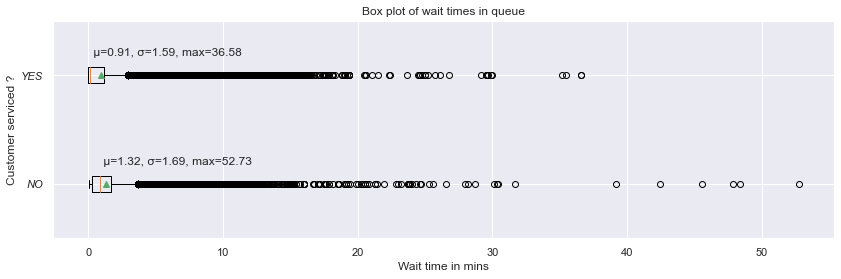

In [47]:
# Box plot
fig, ax = plt.subplots(figsize=(14,4))
df1 = df_calldata2[(df_calldata2['Customer_wait_no_agent'])]['q_time'].apply(lambda x : float(x)/60).rename('Wait time')
df2 = df_calldata2[~(df_calldata2['Customer_wait_no_agent'])]['q_time'].apply(lambda x : float(x)/60).rename('Wait time')
df = [df1,df2]
boxplt = ax.boxplot(df, vert=False,showmeans=True)
ax.set_xlabel("Wait time in mins")
ax.set_title("Box plot of wait times in queue")

for i, line in enumerate(boxplt['medians']):
    x, y = line.get_xydata()[1]
    text = ' μ={:.2f}, σ={:.2f}, max={:.2f} \n'.format(df[i].mean(), df[i].std(),df[i].max())
    ax.annotate(text, xy=(x, y))

ax.set_ylabel('Customer serviced ?',fontsize=12)
ax.set_yticklabels(['NO', 'YES'],style='italic')
plt.show()


Statistical test : t-test to prove the mean of the two distribution are significantly different

In [48]:
# Lets do a t test
df0 = df_calldata2[['Customer_wait_no_agent','q_time']].copy()
df0['q_time'] = df0['q_time'].apply(lambda x : float(x)) 
t_stat,p_val = ttest_ind(df0[df0['Customer_wait_no_agent']]['q_time'],\
                   df0[~df0['Customer_wait_no_agent']]['q_time'], axis=0,equal_var=False)
print("P-value : {}".format(p_val))

P-value : 0.0


The p-value of 0 statistically shows that customers call drops are correlated with higher queue-wait times.

###  Does agents spend significant time servicing each customer calls at peak time cause increase in call drops ?

In [49]:
rec_index = df_calldata2[~(df_calldata2['Customer_wait_no_agent'])].index
df_talktime = df_calldata2.loc[rec_index].set_index('call_datehour_start')['ser_time']\
                .apply(lambda x: float(x)/60).rename('Talk time')
df_talktime_max=df_talktime.resample('1H').max().fillna(0).rename('Talk time')
df_talktime_min=df_talktime.resample('1H').min().fillna(0).rename('Talk time')
df_talktime_mean=df_talktime.resample('1H').mean().fillna(0).rename('Talk time')



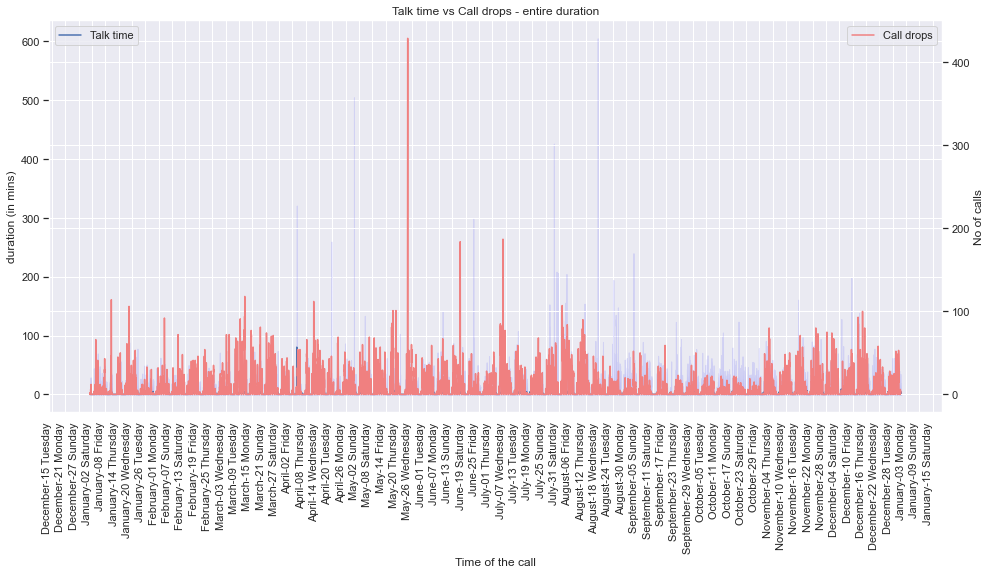

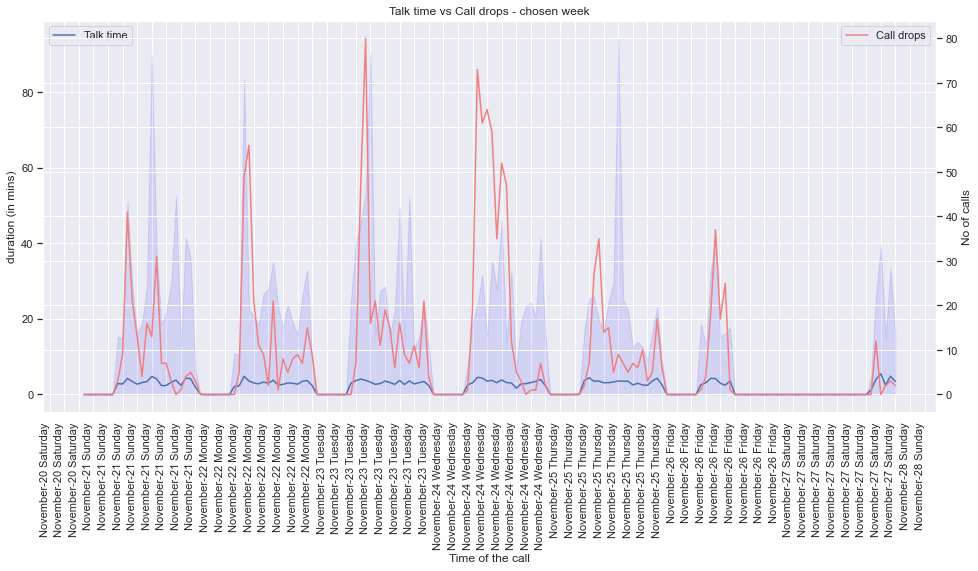

In [50]:
# Min/Avg/Max talk time spent by agent & customer
fig, ax = plt.subplots(figsize=(16,8))

# call talk time (serviced)
df=df_talktime_mean
fig, ax = plot_calls([df],locator=mdates.DayLocator(interval=6),y_label="duration (in mins)",\
                     title='Talk time vs Call drops - entire duration',\
                            fig=fig,ax=ax)
df_min = df_talktime_min
df_max = df_talktime_max
df_mean = df_talktime_mean
ax.fill_between(df_min.index,df_min,df_max,facecolor='blue',color='blue',alpha=0.1)
ax.legend(loc='upper left')

# call drops
rec_index = df_calldata2[(df_calldata2['Customer_wait_no_agent'])].index
df=df_call_drops
ax_mirror = ax.twinx()
fig, ax_mirror = plot_calls([df],locator=mdates.DayLocator(interval=6),y_label="No of calls",\
                            title='',fig=fig,ax=ax_mirror,color='lightcoral')
plt.show()



fig, ax = plt.subplots(figsize=(16,8))
df=df_talktime_mean[df_date_map[df_date_map.values==Week].index]
fig, ax = plot_calls([df],date_format='%B-%d %A %H hrs',locator=mdates.HourLocator(interval=3),\
                            y_label="duration (in mins)",\
                            title='Talk time vs Call drops - chosen week',fig=fig,ax=ax,color='b')
df_min = df_talktime_min[df_date_map[df_date_map.values==Week].index]
df_max = df_talktime_max[df_date_map[df_date_map.values==Week].index]
df_mean = df_talktime_mean[df_date_map[df_date_map.values==Week].index]
plt.fill_between(df_min.index,df_min,df_max,facecolor='blue',color='blue',alpha=0.1)
ax.legend(loc='upper left')

df=df_call_drops[df_date_map[df_date_map.values==Week].index]
ax_mirror = ax.twinx()
fig, ax_mirror = plot_calls([df],locator=mdates.HourLocator(interval=3),y_label="No of calls",\
                            title='',fig=fig,ax=ax_mirror,color='lightcoral')

plt.show()


In [51]:
# plot calls received vs call drops
time_ser_dict = {1:{'ts':df_talktime_mean, 'kwargs': 
                    {'line_color' : 'rgba(0,0,255,1)', 'opacity' : 1.0, 'name' : 'Mean Active calls'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Calls'}},
                2:{'ts':df_talktime_min, 'kwargs': 
                    {'line_color' : None,'name' : 'Min calls','showlegend':False,\
                     'mode':'lines','line_color':'rgba(0,0,255,0.2)'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Calls'}},
                3:{'ts':df_talktime_max, 'kwargs': 
                    {'fill':'tonexty','fillcolor':'rgba(0,0,255,0.2)', \
                     'name' : 'Max calls','showlegend':False,'mode':'lines','line_color':'rgba(0,0,255,0.2)'},
                   'secondary':
                   {'_y':False,'yaxis_title':'Calls'}},
                4:{'ts':df_call_drops, 'kwargs': 
                    {'line_color' : 'red', 'opacity' : 1.0, 'name' : 'Calls dropped'},
                   'secondary':
                   {'_y':True,'yaxis_title':'Call drops'}}
                }
plot_ts(time_ser_dict,title='Talk time vs Call drops')


Visually there is no huge evidence of the impact of Talktime / service time on call drops. Lets test statistically

In [52]:
#calculate cross correlation
# correlation co-efficient
print("Correlation coefficient between Mean service time and call drops : {:.2f} "\
      .format(np.corrcoef(df_call_drops,df_talktime_mean[df_call_drops.index])[0,1]))
print("Correlation coefficient between Max service time and call drops : {:.2f} "\
      .format(np.corrcoef(df_call_drops,df_talktime_max[df_call_drops.index])[0,1]))

Correlation coefficient between Mean service time and call drops : 0.42 
Correlation coefficient between Max service time and call drops : 0.35 


Weak correlation proves the service/talk time is not a huge contributor to call drops. Lets find the distribution of service time

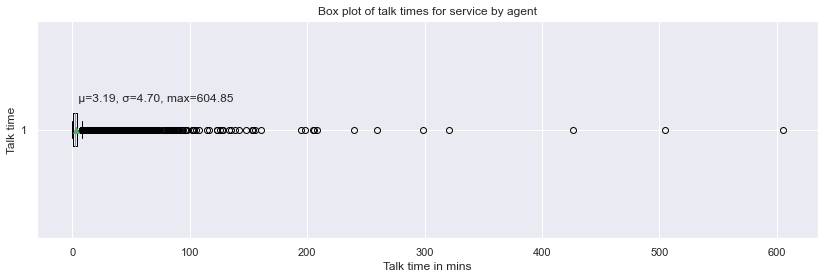

In [53]:
# Distribution of talk time (service)
fig, ax = plt.subplots(figsize=(14,4))
df = df_talktime[df_talktime.values>0]
boxplt = ax.boxplot(df, vert=False,showmeans=True)
ax.set_xlabel("Talk time in mins")
ax.set_ylabel("Talk time")
ax.set_title("Box plot of talk times for service by agent")

for i, line in enumerate(boxplt['medians']):
    x, y = line.get_xydata()[1]
    text = ' μ={:.2f}, σ={:.2f}, max={:.2f} \n'.format(df.mean(), df.std(),df.max())
    ax.annotate(text, xy=(x, y))

plt.show()


In [54]:
# files needed for future analysis
df_calldata2.to_csv(join(data_path,"calldata2.txt"),sep='\t',index=True)
df_call_recvd.to_csv(join(data_path,"callrecvd.txt"),sep='\t',index=True)
df_call_drops.to_csv(join(data_path,"calldrops.txt"),sep='\t',index=True) 
df_agents.to_csv(join(data_path,"callagents.txt"),sep='\t',index=True)
df_ser_calls.to_csv(join(data_path,"sercalls.txt"),sep='\t',index=True)
df_talktime.to_csv(join(data_path,"talktime.txt"),sep='\t',index=True)